In [1]:
#RUN THIS CELL

from IPython.display import HTML, display


HTML('''<script>
function code_toggle() {
 $('.cm-comment:contains(@hidden)').closest('div.input').hide();
} 
$( document ).ready(code_toggle);
</script>''')

#('div.input').show();

In [2]:
# @hidden

from IPython.display import HTML, display
import random as rnd

def hide_toggle(for_next=False, title="Code containing"):
    '''
    HTML function that allows to hide an show code from a specific cell.
    '''
    this_cell = """$('div.cell.code_cell.rendered.selected')"""
    next_cell = this_cell + '.next()'

    show_text = 'Show code'  # text shown on toggle link
    hide_text = 'Hide code'
    toggle_text ='Hide/show'
    target_cell = this_cell  # target cell to control with toggle
    js_hide_current = ''  # bit of JS to permanently hide code in current cell (only when toggling next cell)

    if for_next:
        target_cell = next_cell
        toggle_text += ' next cell'
        js_hide_current = this_cell + '.find("div.input").hide();'

    js_f_name = 'code_toggle_{}'.format(str(rnd.randint(1,2**64)))

    html = """
        <script>
            function {f_name}(code_show=false) {{
                if (code_show){{
                    {cell_selector}.find('div.input').show();
                }} else{{
                    {cell_selector}.find('div.input').hide();
                }}
            }}

            {js_hide_current}
         </script>
        
        
        <h3 style="margin-bottom: 0.5cm;">{title}</h3>
        <a href="javascript:{f_name}(true)">{show_text}</a>
        <a href="javascript:{f_name}(false)">{hide_text}</a>
        
    """.format(
        f_name=js_f_name,
        cell_selector=target_cell,
        js_hide_current=js_hide_current, 
        show_text=show_text,
        hide_text=hide_text,
        title = title,
    )
    
    html2 = """
        <script>
           function hide() {{
               {cell_selector}.find('div.input').hide();
           }}
           {js_hide_current}
         </script>   
         
         <script>hide();</script>
    """.format(
        cell_selector=target_cell,
        js_hide_current=js_hide_current, 
    )
    return display(HTML(html))

hide_toggle(title = "Function to hide code")

In [56]:
from integrateSchrodinger2D import IntegrateSchrodinger2D, calc_norm, empirical_energy
from reservoirComputing import ReservoirComputing
from complexRC import ComplexReservoirComputing, ComplexRidge
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import ticker, cm

import scipy.linalg
from scipy.sparse import random
from scipy.sparse.linalg import eigs
from sklearn.linear_model import LinearRegression,Ridge
from sklearn.metrics import mean_squared_error
from skimage.measure import block_reduce

import plotly
from plotly.graph_objs import graph_objs as go
from plotly.subplots import make_subplots
import plotly.offline as pyo
pyo.init_notebook_mode()


# Resevoir computing for the quartic Hamiltonian

In this notebook we are going to solve the time-dependent Schrödinger equation

$$
i \hbar \frac{d \psi(x,y,t)}{dt} = \hat{H} \psi(x,y,t)
$$

for the quartic oscillator system. That is, the Hamiltonian $\hat{H}$ is:

$$
H(x,y,p_x,p_y) = \frac{p_x^2 + p_y^2}{2m} + \frac{x^2y^2}{2} + \frac{1}{400}(x^4 + y^4)
$$

which is the quartic oscillator. Starting from an initial wavefunction $\psi_0(x)$, we will propagate the wavepacket in time. In order to do so, we use a machine learning technique called Reservoir Computing.

$$
\psi_0(x,y,0) = \left(\frac{1}{\pi}\right)^{1/8} e^{-(x-x_0)^2/(4 \Delta x)^2 -(y-y_0)^2/(4 \Delta y)^2}\;
        e^{i\,p_{0}(x - y)}
$$

From the time evolution of the wavefunction we will obtain, via Fourier Transform, the eigenenergiers and eigenstates of the system. 

**In this notebook compute the states around energy $E=100$.**



## Generate training data

### Coupled Morse potenital

In [57]:
# @hidden

##################################################################################################################
# Parameters

# specify dt and duration
dt = 0.00003#0.000079#0.00025
t_max =50# 0.32#1

# specify constants
hbar = 1   # planck's constant
m = 1.0      # particle mass

dx = 0.1
dy = 0.1
xmin=-15
xmax=15
ymin=-15
ymax=15

x = np.arange(xmin,xmax,dx)
y = np.arange(ymin,ymax,dy)

Nx = x.shape[0]
Ny = y.shape[0]

# Specify potential
x_grid, y_grid = np.meshgrid(x, y, copy=False)


hide_toggle(title = "Parameters Integration")

In [58]:
# Define the potential
epsilon = 0.01

V = 1/2*x_grid**2*y_grid**2 + epsilon/4*(x_grid**4 + y_grid**4)

x0 = 3.665
y0 = -3.665
deltax = 1#np.sqrt(hbar/2)*1.5
deltay = 1#np.sqrt(hbar/2)*1.5
p0x = -3
p0y = -3

psi0 = np.exp(-(x_grid- x0)**2/(4*deltax**2) - (y_grid - y0)**2/(4*deltay**2))*(np.exp(1j*p0x*x_grid/hbar+ 1j*p0y*y_grid/hbar ) \
     + np.exp(1j*p0x*x_grid/hbar- 1j*p0y*y_grid/hbar ) +  np.exp(-1j*p0x*x_grid/hbar- 1j*p0y*y_grid/hbar ) + \
       np.exp(-1j*p0x*x_grid/hbar+ 1j*p0y*y_grid/hbar ))

psi0+=np.exp(-(x_grid+ x0)**2/(4*deltax**2) - (y_grid - y0)**2/(4*deltay**2))*(np.exp(1j*p0x*x_grid/hbar+ 1j*p0y*y_grid/hbar ) \
     + np.exp(1j*p0x*x_grid/hbar- 1j*p0y*y_grid/hbar ) +  np.exp(-1j*p0x*x_grid/hbar- 1j*p0y*y_grid/hbar ) + \
       np.exp(-1j*p0x*x_grid/hbar+ 1j*p0y*y_grid/hbar ))

psi0+=np.exp(-(x_grid- x0)**2/(4*deltax**2) - (y_grid + y0)**2/(4*deltay**2))*(np.exp(1j*p0x*x_grid/hbar+ 1j*p0y*y_grid/hbar ) \
     + np.exp(1j*p0x*x_grid/hbar- 1j*p0y*y_grid/hbar ) +  np.exp(-1j*p0x*x_grid/hbar- 1j*p0y*y_grid/hbar ) + \
       np.exp(-1j*p0x*x_grid/hbar+ 1j*p0y*y_grid/hbar ))

psi0+=np.exp(-(x_grid+ x0)**2/(4*deltax**2) - (y_grid + y0)**2/(4*deltay**2))*(np.exp(1j*p0x*x_grid/hbar+ 1j*p0y*y_grid/hbar ) \
     + np.exp(1j*p0x*x_grid/hbar- 1j*p0y*y_grid/hbar ) +  np.exp(-1j*p0x*x_grid/hbar- 1j*p0y*y_grid/hbar ) + \
       np.exp(-1j*p0x*x_grid/hbar+ 1j*p0y*y_grid/hbar ))

# Initial state
norm = calc_norm(psi0, xmin = xmin, xmax = xmax, ymin = ymin, ymax = ymax)
psi0 *=norm 

E = p0x**2/2 + p0y**2/2 + x0**2*y0**2/2 + epsilon/4*(x0**4 + y0**4)

hide_toggle(title = "Parameters Morse potential")

C:\Users\laiad\anaconda3\lib\site-packages\numpy\ma\core.py:2825: ComplexWarning:

Casting complex values to real discards the imaginary part



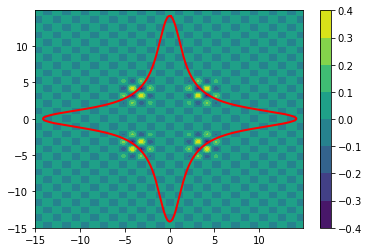

Energy =  100.11445756756562


In [59]:
from skimage.measure import find_contours

contours = find_contours(V, E)

for contour in contours:
    contour = (xmax-xmin)/Nx*contour + xmin
    plt.plot(contour[:, 1], contour[:, 0], color='red', linewidth=2)
plt.contourf(x,y,psi0)
plt.colorbar()
plt.show()

print('Energy = ', E)

## Scaling the Morse potential

Let's consider the trajectory $(x(t), y(t), p_x(t), p_y(t))$ of a particle of mass $m$, which evolves under the Hamiltonian:

$$
\mathcal{H}(x(t), y(t), p_x(t), p_y(t)) = \frac{p_x^2 + p_y^2}{2m} + V(x,y) = \frac{p_x^2 + p_y^2}{2} + \frac{x^2y^2}{2} + \frac{\epsilon}{4}(x^4 + y^4)
$$

Given some initial conditions $(x_0, y_0, p_{x0}, p_{y0})$, the energy of the system is

$$
\mathcal{H}(x(t), y(t), p_x(t), p_y(t)) = E
$$

Since the Hamiltonian is scalable, we can modify the coordinates $(x(t), y(t), p_x(t), p_y(t))$ , so that the energy of the Hamiltonian is $E'$ instead of $E$. In order to do so, we scale the coordinates in the following way:

$$
x':= \eta x\\
y' := \eta y\\
p_x':= \eta^2 p_x\\
p_y' := \eta^2 p_y
$$

We also scale the time as:

$$
t' := t/\eta
$$

And $\hbar$:

$$
\hbar' = \eta^3 \hbar
$$

Where we have chosen the adimensional parameter

$$
\eta = \Big(\frac{E'}{E}\Big)^{1/4}
$$

**Remark**: In this case we will use the scaling of the Hamiltonian to contract the spatial domain to the spatial domain of the state with energy $E=1$ ( which corresponds to $x,y \in [-5,5]$). Therefore, if we define $E'$ as being the largest energy, we will apply the transformations in the opposite way (dividing instead of multiplying). 

In [60]:
Ep = 100.11445756756562
E0 = 1
eta = (Ep/E0)**(1/4)

# Scale x,y
x_gridp = x_grid/eta
y_gridp = y_grid/eta
dxp = dx/eta
dyp = dy/eta

xp = x/eta
yp = y/eta

xminp = xmin/eta
yminp = ymin/eta
xmaxp = xmax/eta
ymaxp = ymax/eta

# Scale time
tp_max = t_max*eta 
dtp = dt*eta

# Scale hbar
hbarp = hbar/(eta**3)

# Define the potential
epsilon = 0.01

Vp = 1/2*x_gridp**2*y_gridp**2 + epsilon/4*(x_gridp**4 + y_gridp**4)

x0p = x0/eta
y0p = y0/eta
deltaxp = deltax/eta#np.sqrt(hbarp/2)*2
deltayp = deltay/eta#np.sqrt(hbarp/2)*2
p0xp = p0x/(eta*eta)
p0yp = p0y/(eta*eta)

psi0p = np.exp(-(x_gridp- x0p)**2/(4*deltaxp**2) - (y_gridp - y0p)**2/(4*deltayp**2))*(np.exp(1j*p0xp*x_gridp/hbarp+ 1j*p0yp*y_gridp/hbarp ) \
     + np.exp(1j*p0xp*x_gridp/hbarp- 1j*p0yp*y_gridp/hbarp )  + np.exp(-1j*p0xp*x_gridp/hbarp- 1j*p0yp*y_gridp/hbarp ) + \
       np.exp(-1j*p0xp*x_gridp/hbarp+ 1j*p0yp*y_gridp/hbarp ))

psi0p+=np.exp(-(x_gridp+ x0p)**2/(4*deltaxp**2) - (y_gridp - y0p)**2/(4*deltayp**2))*(np.exp(1j*p0xp*x_gridp/hbarp+ 1j*p0yp*y_gridp/hbarp ) \
     + np.exp(1j*p0xp*x_gridp/hbarp- 1j*p0yp*y_gridp/hbarp )  + np.exp(-1j*p0xp*x_gridp/hbarp- 1j*p0yp*y_gridp/hbarp ) + \
       np.exp(-1j*p0xp*x_gridp/hbarp+ 1j*p0yp*y_gridp/hbarp ))

psi0p+=np.exp(-(x_gridp- x0p)**2/(4*deltaxp**2) - (y_gridp + y0p)**2/(4*deltayp**2))*(np.exp(1j*p0xp*x_gridp/hbarp+ 1j*p0yp*y_gridp/hbarp ) \
     + np.exp(1j*p0xp*x_gridp/hbarp- 1j*p0yp*y_gridp/hbarp )  + np.exp(-1j*p0xp*x_gridp/hbarp- 1j*p0yp*y_gridp/hbarp ) + \
       np.exp(-1j*p0xp*x_gridp/hbarp+ 1j*p0yp*y_gridp/hbarp ))

psi0p+=np.exp(-(x_gridp+ x0p)**2/(4*deltaxp**2) - (y_gridp + y0p)**2/(4*deltayp**2))*(np.exp(1j*p0xp*x_gridp/hbarp+ 1j*p0yp*y_gridp/hbarp ) \
     + np.exp(1j*p0xp*x_gridp/hbarp- 1j*p0yp*y_gridp/hbarp )  + np.exp(-1j*p0xp*x_gridp/hbarp- 1j*p0yp*y_gridp/hbarp ) + \
       np.exp(-1j*p0xp*x_gridp/hbarp+ 1j*p0yp*y_gridp/hbarp ))

# Initial state
norm = calc_norm(psi0, xmin = xminp, xmax = xmaxp, ymin = yminp, ymax = ymaxp)
psi0 *=norm 

Ep = p0xp**2/2 + p0yp**2/2 + x0p**2*y0p**2/2 + epsilon/4*(x0p**4 + y0p**4)

hide_toggle(title = "Parameters Morse potential")

C:\Users\laiad\anaconda3\lib\site-packages\numpy\ma\core.py:2825: ComplexWarning:

Casting complex values to real discards the imaginary part



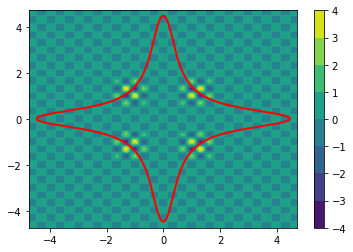

Energy =  1.0000000000000004


In [61]:
from skimage.measure import find_contours

contours = find_contours(Vp, Ep)

for contour in contours:
    contour = (xmaxp-xminp)/Nx*contour + xminp
    plt.plot(contour[:, 1], contour[:, 0], color='red', linewidth=2)
plt.contourf(xp,yp,psi0p)
plt.colorbar()
plt.show()

print('Energy = ', Ep)

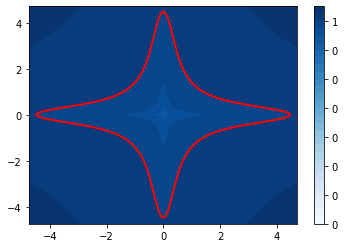

In [62]:
for contour in contours:
    contour = (xmaxp-xminp)/Nx*contour + xminp
    plt.plot(contour[:, 1], contour[:, 0], color='red', linewidth=2)

plt.contourf(xp,yp,Vp, locator=ticker.LogLocator(base=10, numticks=30), cmap=cm.Blues)
plt.colorbar()
plt.show()

In [63]:
# @hidden
import numpy as np
from scipy.integrate import solve_ivp
import csv
from tqdm import tqdm

class IntegrateSchrodinger2D:
    '''
    Class to integrate the Schrodinger equation for arbitrary 1D potentials.
    We use the Kosloff method based on the FFT
    '''
    def __init__(self, x, y, psi0, V, k0 = None, hbar=1, m=1, t0=0.0, dt=0.01):
        
        # Validation of array inputs
        self.x, self.y, psi0, self.V = map(np.asarray, (x, y, psi0, V))
        self.Nx = self.x.shape[1]
        self.Ny = self.y.shape[0]
        assert self.x.shape == (self.Ny,self.Nx)
        assert self.y.shape == (self.Ny,self.Nx)
        assert psi0.shape == (self.Ny,self.Nx)
        assert self.V.shape == (self.Ny,self.Nx)
        
        # Set internal parameters
        self.hbar = hbar
        self.m = m
        self.t = t0
        self.dt = dt
        self.dx = self.x[0,1] - self.x[0,0]
        self.dy = self.y[1,0] - self.y[0,0]
        self.dkx = 2 * np.pi / (self.Nx * self.dx)
        self.dky = 2 * np.pi / (self.Ny * self.dy)
        
        # Set minimum momentum
        if k0 == None:
            self.k0x = -np.pi/self.dx
            self.k0y = -np.pi/self.dy
        else:
            self.k0x = k0
        # Set momentum grid
        self.kx = self.k0x + self.dkx * np.arange(self.Nx)
        self.ky = self.k0y + self.dky * np.arange(self.Ny)
        
        self.kx, self.ky = np.meshgrid(self.kx, self.ky)
        
        # Define psi_xy and psi_xy_old
        self.psi_xy = psi0
        self.psi_xy_old = psi0 # Store old value of psi_xy for finite difference
        self.psi_xy_all = psi0.reshape(1,self.Ny,self.Nx)
        self.dt = dt
        

    
    def compute_psi_k_from_psi_x(self, psi_xy):
        '''
        FFT to psi(x,t)
        We define psi(x,t) multiplied by the term so that psiF_x and psiF_k are Fourier pairs
        '''
        psiF_xy = (psi_xy * np.exp(-1j * self.kx[0,0] * self.x)* np.exp(-1j * self.ky[0,0] * self.y) \
                   *(self.dx *self.dy)/ (2 * np.pi))
        
        psiF_k = np.fft.fft2(psiF_xy)
    
        Nx,Ny = np.meshgrid(np.arange(self.Nx), np.arange(self.Ny))
        
        psi_k = psiF_k * np.exp(-1j * self.x[0,0] * self.dkx * Nx)* \
                np.exp(-1j * self.y[0,0] * self.dky * Ny)
        
        return psi_k


    def compute_psi_x_from_psi_k(self, psi_k):
        '''
        Inverse FFT to psi(k,t)
        We define psi(x,t) multiplied by the term so that psiF_x and psiF_k are Fourier pairs
        '''
        Nx,Ny = np.meshgrid(np.arange(self.Nx), np.arange(self.Ny))
        
        psiF_k = psi_k* np.exp(1j * self.x[0,0] * self.dkx * Nx)* \
                np.exp(1j * self.y[0] * self.dky * Ny)
        
        psiF_xy = np.fft.ifft2(psiF_k)
        
        psi_xy = (psiF_xy* np.exp(1j * self.kx[0,0] * self.x) * \
                  np.exp(1j * self.ky[0,0] * self.y)* (2 * np.pi) / (self.dx*self.dy))
        
        return psi_xy
    
    
    def diff_RK(self, t, psi_xy):
        '''
        Function to pass to the Runge-Kutta method
        '''
        # 1. Calculate nabla^2psi(x,t) by:
        # a) Obtain psi(k,t) using FFT
        psi_k = self.compute_psi_k_from_psi_x(psi_xy.reshape(self.Ny,self.Nx))

        # b) Multiply psi(k,t) by hbar^2 k^2/(2m)
        nabla_psi_k = -psi_k*(self.kx**2 + self.ky**2)

        # c) Obtain the kinetic part in the x space using the inverse FFT
        nabla_psi_xy = -self.hbar**2/(2*self.m)*self.compute_psi_x_from_psi_k(nabla_psi_k)

        # 2. Add V(x)psi(x,t) to obtain H*psi(x,t)
        H_psi = nabla_psi_xy +  self.V*self.psi_xy
        
        return (-1j/self.hbar*H_psi).flatten()

        
    def evolve(self, t_increase, store_all = False, save_file=False, out_file = 'time_evolution.csv'):
        '''
        Algorithm to integrate the Schrodinger equation up to time t_final
        '''
            
        if t_increase<0:
            print('Error. Time increment must be positive')
            return
        
        N_steps = int(np.floor((t_increase)/self.dt)+1) #Number of steps to reach t_final from current time
        
        #Initialization: Obtain psi_1 from psi_0 using a Runge-Kutta method
        sol = solve_ivp(self.diff_RK, [0, self.dt], self.psi_xy_old.flatten())
        self.psi_xy = sol.y[:,-1].reshape(self.Ny,self.Nx)
        if store_all:
            self.psi_xy_all = np.concatenate((self.psi_xy_all, self.psi_xy.reshape(1,self.Ny, self.Nx)), axis=0)
        
        save_i=0
        #For each time step:
        for i in tqdm(range(1, N_steps)):
         #   print('Time step: {}/{}'.format(i, N_steps), end='\r')
        # 1. Calculate nabla^2psi(x,t) by:
            # a) Obtain psi(k,t) using FFT
            psi_k = self.compute_psi_k_from_psi_x(self.psi_xy.copy())
            
            # b) Multiply psi(k,t) by hbar^2 k^2/(2m)
            nabla_psi_k = -psi_k*(self.kx**2 + self.ky**2)
            
            # c) Obtain the kinetic part in the x space using the inverse FFT
            nabla_psi_xy = -self.hbar**2/(2*self.m)*self.compute_psi_x_from_psi_k(nabla_psi_k)

        # 2. Add V(x)psi(x,t) to obtain H*psi(x,t)
            H_psi = nabla_psi_xy +  self.V*self.psi_xy
            
                
        # 3. Calculate psi(x, t+dt) = psi(x, t-dt) - 2i/h*dt*H*psi(x,t) 
            aux = self.psi_xy.copy() # Store value to set it as the old value later
            self.psi_xy = self.psi_xy_old - 2*1j/self.hbar*self.dt*H_psi
            self.psi_xy_old = aux #Set old value of psi
           
            if store_all:
                self.psi_xy_all = np.concatenate((self.psi_xy_all, self.psi_xy.reshape(1,self.Ny, self.Nx)), axis=0)
            if save_file:
                #if i==1:
                #    with open(out_file,'wb') as f:
                #        np.savetxt(f, self.psi_xy.flatten(), delimiter=',', newline='\n')
                #if i%10==0:
                #    with open(out_file,'a') as f:
                #        np.savetxt(f, self.psi_xy.flatten(), delimiter=',', newline='\n')
                if i%int(N_steps/30)==0:
                    filename = out_file + str(save_i) + '.npy'
                    save_i+=1
                    with open(filename, 'wb') as f:
                        np.save(f, self.psi_xy_all)
                    self.psi_xy_all = self.psi_xy.reshape(1,self.Ny, self.Nx)
                else:
                    if i%100==0:
                        self.psi_xy_all = np.concatenate((self.psi_xy_all, self.psi_xy.reshape(1,self.Ny, self.Nx)), axis=0)
                    

        # Increase final time
        self.t += t_increase            


        
        
def calc_norm(phi, xmin=-5, xmax=5, ymin=-10, ymax = 10):
    '''
    Calculates the norm of an eigenfunction
    Args:
        phi (np.array): wave function values
        xmin (float): minimum value of x
        xmax (float): maximum value of x
        ymin (float): minimum value of y
        ymax (float): maximum value of y
        n_points (int): Number of grid points of x
    Returns:
        (float): norm of phi(x)
    '''
    (Ny,Nx) = phi.shape
    h1 = (xmax - xmin)/Nx
    h2 = (ymax - ymin)/Ny
    return 1./np.sqrt(np.sum(np.conjugate(phi)*phi*h1*h2))
     
def empirical_energy(phi, potential, xmin=-10, xmax = 10,
                       ymin=-10, ymax = 10, hbar=1, m=1):
    '''
    Calculates empirical energy for 2D potentials
    Args:
      phi (np.array): Wavefunction
      potential (np.array): Potentials V(x,y)
      xmin (int): minimum value of x
      xmax (int): maximum value of x
      ymin (int): minimum value of y
      ymax (int): maximum value of y
      n_points (int): number of points in the grid
      hbar (float): h bar
      m (float): mass
    Returns:
      energy (np.array): mean empirical energy for each sample
    '''
    (_,Ny,Nx) = phi.shape
    h1 = (xmax - xmin)/Nx
    h2 = (ymax - ymin)/Ny
    phi = np.asarray(phi)
    if phi.shape!= potential.shape:
        phi = np.reshape(phi, potential.shape)

    # We first calculate the second derivative of phi
    # derivative x
    phir = phi.copy()
    phir[:,:,0] = 0
    phir[:,:,1:] = phi[:,:,:-1]
    phil = phi.copy()
    phil[:,:,-1] = 0
    phil[:,:,:-1] = phi[:,:,1:]
    deriv_x = (phir - 2*phi + phil)/(h1*h2)

    # derivative y
    phir = phi.copy()
    phir[:,0,:] = 0
    phir[:,1:,:] = phi[:,:-1,:]
    phil = phi.copy()
    phil[:,-1,:] = 0
    phil[:,:-1,:] = phi[:,1:,:]
    deriv_y = (phir - 2*phi + phil)/(h1*h2)

    # Now we calculate the mean energy
    energy = np.sum((-hbar*hbar/(2*m)*np.conjugate(phi)*(deriv_x + deriv_y) + potential*(np.conjugate(phi)*phi))*h1*h2, axis=(1,2))
    return energy

hide_toggle(title = "Integrate Schrodinger eq")        

In [11]:
# @hidden

############   #####################################################################################################
# Generate data integrating the Schrodi nger equation
S = IntegrateSchrodinger2D(x_gridp, y_gridp, psi0p, Vp, dt=dtp, m = m, hbar = hbarp)

S.evolve(tp_max, store_all=False, save_file=True, out_file='quartic.csv')

hide_toggle(title = "Run to integrate the Schrodinger equation")

100%|██████████| 1666666/1666666 [24:47:35<00:00, 18.67it/s]   


In [ ]:
for i in range(30):
    print(i)
    filename = 'quartic.csv' + str(i) + '.npy'
    with open(filename, 'rb') as f:
            a = np.load(f)
    a = block_reduce(a, block_size=(1, 2, 2), func=np.mean)
    if i==0:
        psi = a
    else:
        psi = np.vstack([psi,a])

In [13]:
with open('training_data/psi_quarticE100.npy', 'wb') as f:
    np.save(f, psi)

In [19]:
# @hidden

from IPython.display import HTML, display
from matplotlib.animation import FuncAnimation
plt.ioff()

# Steps to display the wavefunction. i.e we display psi(i*display)
interval=50

fig, ax=plt.subplots()
# Conservation of energy and momentum text
props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
#textstr = '\n'.join((
#    r'$E=%.2f$' % (E[0], ),
#    r'$|\psi|^2=%.2f$' % (norm[0], )))


#timelabel = ax.text(0.08, 0.95, textstr, transform=ax.transAxes, fontsize=14,
#        verticalalignment='top', bbox=props)

q1 = np.arange(xmin,xmax,dx)
q2 = np.arange(ymin,ymax,dy)
p = [ax.contourf(psi[0]) ]
fig.colorbar(p[0])

# Title
title = ax.set_title("")


def update(i):
    for tp in p[0].collections:
        tp.remove()
    
    psidata = psi[i*interval,:,:]
    p[0] = ax.contourf(psidata) 

    #timelabel.set_text('\n'.join((
    #                    r'$E=%.2f$' % (E[i*interval], ),
    #                    r'$|\psi|^2=%.2f$' % (norm[i*interval], ))))
    title.set_text("t = {:.2f}".format(dt*i*interval))
    
    return p[0].collections#+[timelabel]

ani = FuncAnimation(fig, update, frames=int(psi.shape[0]/interval), interval=40, blit=True, repeat=True)

display(HTML(ani.to_html5_video()))
plt.close(fig)

hide_toggle(title = "Animation")

C:\Users\laiad\anaconda3\lib\site-packages\numpy\ma\core.py:2825: ComplexWarning:

Casting complex values to real discards the imaginary part

C:\Users\laiad\anaconda3\lib\site-packages\numpy\ma\core.py:2825: ComplexWarning:

Casting complex values to real discards the imaginary part



In [11]:
psi = block_reduce(psi, block_size=(1, 2, 2), func=np.mean)
psi.shape

(16695, 75, 75)

In [64]:
with open('psi_quarticE100.npy', 'rb') as f:
            psi= np.load(f)
            
final = psi.shape[0]
step = 1
psi = psi[range(0,final,step),:,:]

psi.shape

(16695, 150, 150)

In [65]:
# @hidden

import numpy as np
import matplotlib.pyplot as plt
import scipy.linalg
from scipy.sparse import random
from scipy.sparse.linalg import eigs
from sklearn.linear_model import LinearRegression,Ridge
from sklearn.metrics import mean_squared_error
import scipy.sparse
import pickle
import plotly
from plotly.graph_objs import graph_objs as go
from plotly.subplots import make_subplots
import plotly.offline as pyo
from tqdm import tqdm
pyo.init_notebook_mode()

np.random.seed(0)

class ComplexRidge:
    def __init__(self, alpha=0.0001):
        self.alpha = alpha
        
    def fit(self, X, Y):
        # Add bias (column of 1ns)
        X = np.concatenate((np.ones((X.shape[0],1)), X), axis=1)
        X_star = X.conj().T

        inv = scipy.linalg.inv(X_star.dot(X) + self.alpha*np.identity(X.shape[1]))
        self.beta = inv.dot(X_star).dot(Y)
        
    def predict(self, X):
        X = np.concatenate((np.ones((X.shape[0],1)), X), axis=1)
        pred = self.beta.T.dot(X.T).T

        return pred
    
    def mse(self, y_true, y_pred):
        mse = np.real(np.mean(np.conjugate(y_true - y_pred)\
                              *(y_true - y_pred)))
        return mse
    
class ComplexReservoirComputing():
    '''
    Class to define a Reservoir Computing Network. It also contains the functions to calculate the echo states,
    train the network and test it with unseen data.

    Attributes:
        n_min (int): Number of time steps to dismiss
        t_step (int): Number of time steps to let the network evolve
        W_in (sciypy.sparse matrix): (size (N,K)) Input connections
        W_back (scipy.sparse matrix): (size (N,L)) Back connections
        W (scipy.sparse.matrix): (size (N,N)) Reservoir matrix
        L (int): output size
        K (int): input size
        N (int): Number of nodes of the reservoir
        u (np.array): (size t_step,K)) input for training
        y_teach (np.array): (size (t_step,L)) output for training
        initial state (np.array): (size N) initial value of the internal states x(0)
        f (function): Activation function
        f_out (function): Activation function for the output
        states (np.array): Internal states
        predictor (np.array): Learning algorithm
    '''
    def __init__(self, n_min = None, t_step=None, W_in = None, W = None, W_back = None,
                 u = None, y_teach = None, initial_state = None, f = None, f_out = None,
                f_out_inverse =lambda x:x, restore = False, folder='trained_model'):
        
        # Training parameters
        self.n_min = n_min #dismissed time steps (int)
        self.t_step = t_step
        
        if restore:
            self.load(folder)
            
        else:
            # Matrices
            self.W_in = W_in #input connections 
            self.W_back = W_back
            self.W = W #adjacency matrix (matrix of size self.N x self.N)
            
            # Input and output
            self.u = u #input
            self.y_teach = y_teach #desired output of the network

            self.nu = None  # Noise given to the reservoir
            
            self.states = None # matrix containing the internal states of the reservoir:
                            # columns -> nodes; rows -> time steps
                
            self.predictor = None #Linear regressor predictor

        # Dimension values
        self.N = self.W.shape[0] #dimension of the reservoir, i.e, number of nodes (int)
        if self.W_back is not None:
            self.L = self.W_back.shape[1] #dimension of the output (int)
        else:
            self.L = 0
        if self.W_in is not None:
            self.K = self.W_in.shape[1] #dimension of the input (integer) (may be None)
        else:
            self.K = 0
        

        
        self.initial_state = initial_state #initial state of the reservoir
        self.f = f #activation function of the reservoir
        self.f_out = f_out #activation function of the output
        self.f_out_inverse = f_out_inverse # Inverse of the output activation function
    
    
    def evolve_trajectories(self, noise=False, boundary_noise=0.00001,
                            long_formula=False, C=0.49, a=0.9):
        '''
        Function to update the internal states x(n) with time. 
        Attributes:
            noise (boolean): If true, random noise is added to the output
            boundary_noise (float): Upper and lower bounds for the noise
            long_formula (boolean): If true, the long-memory update for the internal states is used
            C (float): Value of C for the long formula
            a (float): Value of a for the long formula
            
        '''
        # Set initial state
        self.states = self.initial_state
        x_prev = self.initial_state
        
        # If noise==True we add random uniform noise to the output
        if noise and self.y_teach is not None:
            nu = np.random.uniform(low=-boundary_noise, high=boundary_noise,
             size=self.y_teach.shape)
            y = self.y_teach + nu
            self.nu = nu
        else:
            y = self.y_teach
        
        # We update the internal states at each time step
        for n in tqdm(range(self.t_step)):               
            if self.u is None: # If there is no input
                x = self.f(self.W.dot(x_prev) + self.W_back.dot(y[n-1]))
            elif self.y_teach is None: # If there is input but no output
                x = self.f(self.W.dot(x_prev) + self.W_in.dot(self.u[n]))
            else: # If there is input and output
                x = self.f(self.W.dot(x_prev) + self.W_in.dot(self.u[n]) + self.W_back.dot(y[n-1]))
            if long_formula: # We can also use the long-memory update
                x = (1.-C*a)*x_prev + C*x
            
            # We stack the new internal state
            self.states = np.vstack((self.states,x))
            x_prev = x

        self.states = self.states[1:,:]
    

    def dismiss_initial_states(self):
        '''
        Function to dismiss the n_min initial states
        '''
        self.states = self.states[self.n_min:,:]

    def dismiss_initial_output(self):
        '''
        Function to dismiss the n_min initial outputs
        '''
        self.y_teach = self.y_teach[self.n_min:]
    
    def augmented_x(self, M):
        '''
        Function to crate the vector \tilde{x} = (x, x^2)
        Args:
            M (np.array): Matrix containing the internal states
        Returns:
            (np.array): Augmented internal states
        '''
   
        aux1 = M[:,:int(self.N/2)]
        aux2 = M[:,int(self.N/2):]
    
        return np.hstack((aux1, aux2**2))
    
    
    def train(self, noise=False, boundary_noise=0.00001, ridge=True, alpha = 1e-12, 
              long_formula = False, C=0.49, a=0.9, augmented = False):
        '''
        Function to train the reservoir.
        Args:
            noise (boolean): If true, random noise is added to the output
            ridge (boolean): If ture, a Ridge regression is used instead of a linear regression
            alpha (float): alpha value for the Ridge regression
            long_formula (boolean): If true, the long-memory update for the internal states is used
            C (float): Value of C for the long formula
            a (float): Value of a for the long formula
            augmented (boolean): If true, the augmented x is used in the fit method
        Returns:
            MSE_vector (np.array): size L. Vector containing the mean square error for each dimension of the ouput
        '''
        
        # 1. Evolve internal states
        self.evolve_trajectories(noise=noise, boundary_noise=boundary_noise, 
                                long_formula = long_formula, C=C, a=a)
        # 2. Dismiss initial states and output
        self.dismiss_initial_states()
        self.dismiss_initial_output()
        # 3. Find W^out
        if ridge: # We can use a Ridge regression instead than a lenar rergression
            lm =  ComplexRidge(alpha=alpha)
        else: # Using a linear regression
            lm = ComplexRidge(alpha=0)
        if augmented: # Using the augmented states (x,x^2)
            lm.fit(self.augmented_x(self.states), self.f_out_inverse(self.y_teach)) # Fit method
            y = self.f_out(lm.predict(self.augmented_x(self.states))) # Predict output
        else:
            lm.fit(self.states, self.f_out_inverse(self.y_teach))  # Fit method
            y = self.f_out(lm.predict(self.states)) # Predict output
            
        #Compute MSE
        MSE_vector = 1/(self.t_step-self.n_min)* \
                    sum(np.conjugate(self.y_teach - y)*(self.y_teach - y))
        
        self.predictor=lm
        
        return MSE_vector

    
    def test(self, t_autonom=50, t_dismiss=100, u=None, use_W_back=True, y_true=None,
             long_formula=False, C=0.49, a=0.9,
             augmented = False, update_x = False, step_chaos=100):
        '''
        Function to test the reservoir with unseen data.
        Args:
            t_autonom (int): Number of time steps used to predict new data
            t_dismiss (int): Dissmissal time steps
            u (np.array): Input for future data
            use_W_back (boolean): If true, we use backwards connections
            y_true (np.array): True new data, used to calculate test MSE
            long_formula (boolean): If true, the long-memory update for the internal states is used
            C (float): Value of C for the long formula
            a (float): Value of a for the long formula
            augmented (boolean): If true, the augmented x is used in the fit method
       
        Returns:
            y_tot (np.array): predicted y for each time step
            mse (np.array): test mse
        '''
        # Set initial states and outputs to the time t_step-t_dismiss
        x_prev = self.states[-(t_dismiss-1)]
        y =self.y_teach[-(t_dismiss)]
        y_tot=y
        mse=None
        
        # Evolve the internal state for each time
        for n in tqdm(range(t_dismiss + t_autonom)):
            if u is None: # If there is no input
                x = self.f(self.W.dot(x_prev) + self.W_back.dot(y))
            elif use_W_back: # If there is input and output
                x = self.f(self.W.dot(x_prev) + self.W_in.dot(u[n]) + self.W_back.dot(y))
            else: # If there is only input
                x = self.f(self.W.dot(x_prev) + self.W_in.dot(u[n]))
            if long_formula: # If we want to use the long-memory formula
                x = (1.-C*a)*x_prev + C*x
                
            x_prev = x
            if augmented: # If we want to use the augmented internal states (x,x^2)
                y = self.f_out(self.predictor.predict(self.augmented_x(x.reshape(1,-1)).reshape(1,-1))[0])
            else:
                y = self.f_out(self.predictor.predict(x.reshape(1,-1))[0]) # Predict output
            if n%step_chaos<2 and n>=t_dismiss:
                y_tot = np.vstack([y_tot,y])
                y = y_true[n - t_dismiss]
            else:    
                y_tot = np.vstack([y_tot,y])
            
            if update_x:
                if n>=t_dismiss: # Update the internal states
                    self.states = np.vstack((self.states,x))
                else: # Add the new internal states
                    self.states[-(t_dismiss-1) + n] = x
        
        y_tot = y_tot[ 1:,:]
        if y_true is not None: # If we have the true output, we calculate the test MSE
            mse= np.mean(np.conjugate(y_true-y_tot[t_dismiss:])*(y_true-y_tot[t_dismiss:]), axis=0)
        return y_tot,mse

    
    def save(self, folder):
        with open(folder + '/states.npy', 'wb') as f:
            np.save(f, self.states)
            
        with open(folder +'/y_teach.npy', 'wb') as f:
            np.save(f, self.y_teach)
        
        with open(folder +'/nu.npy', 'wb') as f:
            np.save(f, self.nu)
            
        with open(folder +'/u.npy', 'wb') as f:
            np.save(f, self.u)
            
        scipy.sparse.save_npz(folder +'/W.npz', self.W)
        scipy.sparse.save_npz(folder +'/W_in.npz', self.W_in)
        scipy.sparse.save_npz(folder +'/W_back.npz', self.W_back)
        pickle.dump(self.predictor, open(folder +'/W_out.sav', 'wb'))

    
    def load(self, folder):
        with open(folder +'/states.npy', 'rb') as f:
            self.states = np.load(f,allow_pickle=True)
        with open(folder +'/y_teach.npy', 'rb') as f:
            self.y_teach = np.load(f,allow_pickle=True)
        with open(folder +'/nu.npy', 'rb') as f:
            self.nu = np.load(f,allow_pickle=True)
        with open(folder +'/u.npy', 'rb') as f:
            self.u = np.load(f,allow_pickle=True)
            
        self.W = scipy.sparse.load_npz(folder +'/W.npz')
        self.W_in = scipy.sparse.load_npz(folder +'/W_in.npz')
        self.W_back = scipy.sparse.load_npz(folder +'/W_back.npz')

        self.predictor = pickle.load(open(folder +'/W_out.sav', 'rb'))

hide_toggle(title = "Reservoir computing")        

## Defining training parameters

In [66]:
# @hidden

final = psi.shape[0]
step = 1
#psi_reduced = block_reduce(psi[range(0,final,step),:,:], block_size=(1, 2, 2), func=np.mean)
psi_reduced = psi[range(0,final,step),:,:]

### Parameters of the reservoir
t_step = 3000
n_min = 500

f = lambda x: np.tanh(np.real(x)) + 1j*np.tanh(np.imag(x))
f_out = lambda x: x#np.tanh
f_out_inverse = lambda x: x#np.arctanh

N = 10000 # Number of nodes
L1 = psi_reduced.shape[1]
L2 = psi_reduced.shape[2]# Number of spatial steps (output dimension)
K = 0 # Input dimension
t_autonom = 8000
t_dismiss = 20

### Networks
# 1. Reservoir
def rand(n):
    np.random.seed(0)
    return np.random.choice([-0.5,0.5], n, p = [0.5,0.5])

W = scipy.sparse.random(N,N, density=0.005, random_state=1234, data_rvs = rand)
vaps,_ = eigs(W, k=15)
alpha = np.max(np.abs(vaps))
W = 0.5/alpha*W #Reescale the matrix to reduce the spectral radius # 0.9

# 2. W^back
def rand2(n):
    np.random.seed(0)
    return np.random.uniform(low=-0.05, high=0.05, size=n)

W_back = scipy.sparse.random(N,L1*L2, density=0.1, random_state=1234, data_rvs = rand2)

# 3. W^in
def rand3(n):
    np.random.seed(0)
    return np.random.choice([-0.14,0.14], n, p = [0.5,0.5])

W_in = scipy.sparse.random(N,K, density=1.0, random_state=1234, data_rvs = rand3)

# Input
u = 0.1*np.ones((t_step,K))
u_test = 0.1*np.ones((t_autonom + t_dismiss,K))

# Initial states
initial_state = np.ones(N)


# Output
y_teach = psi_reduced[:t_step,:]
y_teach = y_teach.reshape(-1,L1*L2)/4

# Output for prediction
y_true = psi_reduced[t_step:t_step + t_autonom,:]
y_true = y_true.reshape(-1,L1*L2)/4

hide_toggle(title = "Defining training parameters")

### Complex wavefunction

In [68]:
# Define the newtwork
net = ComplexReservoirComputing(n_min=n_min, t_step=t_step, W_in = W_in, W=W , W_back=W_back,
                         u = u, y_teach=y_teach, initial_state=initial_state, 
                         f=f, f_out=f_out, f_out_inverse = f_out_inverse)
#Train the network
train_mse=net.train(noise=True,boundary_noise=0.001, ridge=True, augmented = False,
                    alpha = 1e-1, long_formula=True, C=0.017, a=0.9)
#net.train(noise=True,boundary_noise=0.001, ridge=True, augmented = False, alpha = 1e-1, long_formula=True, C=0.017, a=0.9)
#net.train(noise=True,boundary_nois  e=0.001, ridge=True, augmented = False, alpha = 1e-3, long_formula=True, C=0.2, a=0.9)

100%|████████████████████████████████████████████████████████████████████████████| 8000/8000 [1:02:56<00:00,  2.12it/s]


In [69]:
# Run to load model
#net = ReservoirComputing(n_min=n_min, t_step=t_step, f=f, f_out=f_out, f_out_inverse = f_out_inverse,
#                         restore = True, folder='trained_models/2D/quarticE100')

In [70]:
# test network
y_pred,test_mse = net.test(t_autonom,t_dismiss, u=u_test, y_true=y_true, 
                           augmented = False, long_formula=True, C=0.017,
                           a=0.9, update_x = False)

100%|██████████████████████████████████████████████████████████████████████████████| 3020/3020 [34:40<00:00,  1.45it/s]


In [71]:
print("Train mean MSE = {}".format(np.real(np.mean(train_mse)/4)))
print("Test mean MSE = {}".format(np.real(np.mean(test_mse)/4)))

Train mean MSE = 3.8057660026046064e-05
Test mean MSE = 0.0004613795561264478


In [23]:
print("Train mean MSE = {}".format(np.real(np.mean(train_mse)/4)))
print("Test mean MSE = {}".format(np.real(np.mean(test_mse)/4)))

Train mean MSE = 2.7336427108175305e-05
Test mean MSE = 0.0002759431716453506


In [72]:
# Save model
#net.save('trained_models/2D/quarticE100')

## Energy spectrum

We will calculate the energy spectrum of the true and predicted wavefunctions so as to find the eigen energies and eigen states.

The time-correlation function is defined as:

$$
A(t) = <\psi(t)|\psi(0)> = \int_y \int_x \psi(t)^* \psi(0) dx dy
$$

Then, the energy spectrum is the Fourier transform of the time-correlation function:

$$
I(E) = \int_t A(t) e^{-i E t \hbar} dt
$$

In [73]:
# @hidden
from tqdm import tqdm

def time_correlation(psi_t, psi_0, xmin=-5, xmax=5, ymin=-5, ymax=5):
    N = psi_0.shape[0]
    h1 = (xmin-xmax)/N
    h2 = (ymin-ymax)/N
    A = np.sum(np.conjugate(psi_t)*psi_0*h1*h2)
    return A

def time_correlation_function(psi, xmin=-5, xmax=5,  ymin=-5, ymax=5):
    A = np.array([time_correlation(psi[i], psi[0], \
                 xmin=xmin, xmax=xmax, ymin=ymin, ymax=ymax) \
                  for i in range(psi.shape[0])])
    return A

def energy_spectrum(A, dt,t_max, E, hbar=1):
    t = np.arange(0, t_max, dt)
    I = np.sum(A*np.exp(-1j*hbar*E*t)*dt)
    return I

def energy_spectrum_function(A, dt, t_max, Emin=0, Emax=20, dE=0.05, hbar=1):
    E = np.arange(Emin, Emax, dE)
    I = np.array([energy_spectrum(A, dt,t_max, E[i], hbar)  
                  for i in tqdm(range(E.shape[0]))])
    return I

hide_toggle(title = "Code for energy spectrum")    

In [74]:
# With complex RC
y_teach = y_teach.reshape(-1,L1,L2)
y_true = y_true.reshape(-1,L1,L2)
y_pred = y_pred.reshape(-1,L1,L2)
psi_pred = np.concatenate((y_teach, y_pred[t_dismiss:]), axis=0)*4
psi_true = np.concatenate((y_teach, y_true), axis=0)*4

step=1

In [75]:
A_true = time_correlation_function(psi_true, xmin=xmin, xmax=xmax, ymin=ymin, ymax=ymax)
A_pred = time_correlation_function(psi_pred, xmin=xmin, xmax=xmax, ymin=ymin, ymax=ymax)

In [76]:
dt = 0.00003*100*step
dt2 = 0.00003*100*step
t_max = psi_true.shape[0]*dt
Emin=0
Emax=120
dE=0.0001
I_true = energy_spectrum_function(A_true, dt, t_max,
                                  Emin=Emin, Emax=Emax,dE=dE)#, hbar=hbarp)
I_pred = energy_spectrum_function(A_pred, dt2, t_max,
                                  Emin=Emin, Emax=Emax,dE=dE)#, hbar=hbarp)

100%|██████████████████████████████████████████████████████████████████████| 1200000/1200000 [12:54<00:00, 1549.86it/s]


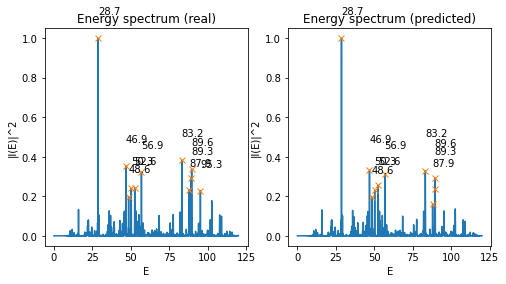

In [93]:
# @hidden

from scipy.signal import find_peaks

I_true_mod =  np.real(np.conjugate(I_true)*I_true)
I_true_mod =  I_true_mod/np.max(I_true_mod)
peaks_true, _ = find_peaks(I_true_mod, height=0.18)

I_pred_mod =  np.real(np.conjugate(I_pred)*I_pred)
I_pred_mod = I_pred_mod/np.max(I_pred_mod)
peaks_pred, _ = find_peaks(I_pred_mod, height=0.14)
E = np.arange(Emin, Emax, dE)

# PLOT
fig, (ax1, ax2) = plt.subplots(1,2, figsize=(8,4))
ax1.plot(E,I_true_mod)
ax1.plot(E[peaks_true], I_true_mod[peaks_true], "x")
ax1.set_title("Energy spectrum (real)")
ax1.set_xlabel("E")
ax1.set_ylabel("|I(E)|^2")

for i in range(peaks_true.shape[0]):
    ax1.text(E[peaks_true][i]-0.1, I_true_mod[peaks_true][i]+0.12,
             round(E[peaks_true][i],1), fontsize=10)

ax2.plot(E,I_pred_mod)
ax2.plot(E[peaks_pred], I_pred_mod[peaks_pred], "x")
ax2.set_title("Energy spectrum (predicted)")
ax2.set_xlabel("E")
ax2.set_ylabel("|I(E)|^2")
for i in range(peaks_pred.shape[0]):
    ax2.text(E[peaks_pred][i]-0.2, I_true_mod[peaks_pred][i]+0.12,
             round(E[peaks_pred][i],1), fontsize=10)
plt.show()

hide_toggle(title = "Energy spectrum")

In [96]:
E[peaks_pred]

array([28.6641, 46.8783, 48.5821, 50.2597, 52.5701, 56.924 , 83.2003,
       87.9378, 89.3349, 89.5994])

In [97]:
E[peaks_true]

array([28.6643, 46.8794, 48.5846, 50.2605, 52.5642, 56.9221, 83.1969,
       87.9381, 89.3304, 89.5899])

In [95]:
with open('psi_quarticE100_I_true.npy', 'wb') as f:
    np.save(f, I_true_mod)
    
with open('psi_quarticE100_I_pred.npy', 'wb') as f:
    np.save(f, I_pred_mod)

## Eigenstates

The eigenstates of the Hamiltonian are then:

$$
\phi_n(x,y) = \int_t \psi(x,y,t) e^{i E_n t\hbar} dt
$$

In [98]:
# @hidden
from scipy.special import eval_hermite

# Empirical wavefunctions
Enp = E[peaks_pred]
Ent = E[peaks_true][[0,1,2,3,4,5,6,7,8,9]]

En = []
En_true = []
for E in Enp:
    for Et in Ent:
        if np.isclose(E, Et, rtol=1e-3):
            En.append(E)
            En_true.append(Et)
            break
En = np.array(En)
En_true = np.array(En_true)
            
t = np.arange(0, t_max, dt)
t2 = np.arange(0, t_max, dt2)

def eigenfunctions_emp(psi_pred, E,t,dt,x,y, hbar=1):
    phi_E= np.array([[np.sum(psi_pred[:,i,j]*np.exp(1j*E*t*hbar)*dt)
                      for i in range(psi_pred.shape[1])]
                      for j in range(psi_pred.shape[2])])
    
    h1 = (x[-1] - x[0])/x.shape[0]
    h2 = (y[-1] - y[0])/y.shape[0]
    C = 1/np.sqrt(np.sum(np.conjugate(phi_E)*phi_E*h1*h2))
    return phi_E*C

#x = np.arange(xminp, xmaxp, dxp)
#y = np.arange(yminp, ymaxp, dyp)
x = np.arange(xmin, xmax, dx*2)
y = np.arange(ymin, ymax, dy*2)
phi_n = np.array([eigenfunctions_emp(psi_pred, En[j],t2,dt2,x,y)#, hbar=hbarp)
                  for j in tqdm(range(En.shape[0]))])

phi_n_true = np.array([eigenfunctions_emp(psi_true, En_true[j],t,dt,x,y)#, hbar=hbarp)
                  for j in tqdm(range(En_true.shape[0]))])

hide_toggle(title = "Calculate the real and predicted wavefunctions")

100%|██████████████████████████████████████████████████████████████████████████████████| 10/10 [03:26<00:00, 20.60s/it]


IndexError: index 3 is out of bounds for axis 0 with size 3

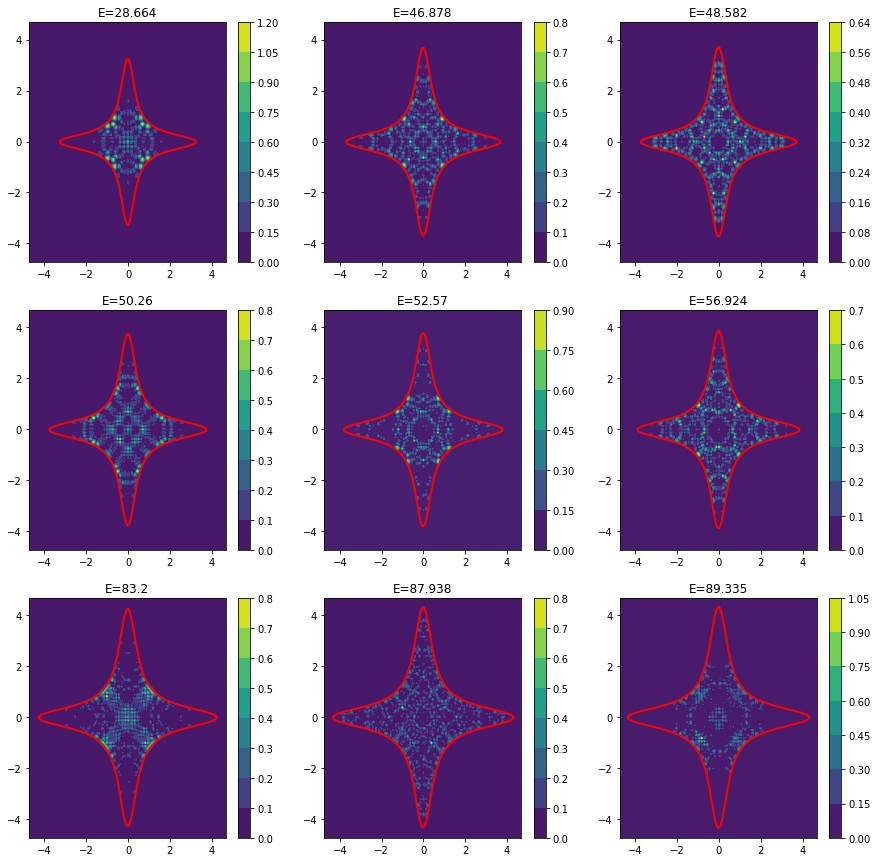

In [100]:
lst = []

row = 3
col = 3

fig, ax = plt.subplots(row,col, figsize=(15,15))

x = np.arange(xminp,xmaxp,dxp*2)
y = np.arange(yminp,ymaxp,dyp*2)
h1 = (x[-1] - x[0])/x.shape[0]
h2 = (y[-1] - y[0])/y.shape[0]

V_red = block_reduce(V, block_size=( 2, 2), func=np.mean)
for k in range(En.shape[0]):
    i = int(k/col)
    j = k%col
    if k not in lst:
        C = 1/np.sqrt(np.sum(np.real(phi_n[k])*np.real(phi_n[k])*h1*h2))
        phi = C*np.real(phi_n[k])
        
    else:
        C = 1/np.sqrt(np.sum(np.imag(phi_n[k])*np.imag(phi_n[k])*h1*h2))
        phi = C*np.imag(phi_n[k])
    
    C = 1/np.sqrt(np.sum(phi_n[k]*phi_n[k]*h1*h2))
    phi2 = np.real(np.conjugate(C*phi_n[k])*C*phi_n[k])
    cb = ax[i][j].contourf(x,y,phi2)# locator=ticker.LogLocator(base=10, numticks=200))#, cmap=cm.Blues)
    plt.colorbar(cb, ax = ax[i][j])
    ax[i][j].set_title("E={}".format(round(En[k],3)))
    
    # Contour plot
    contours = find_contours(V_red, En[k])
    for contour in contours:
        Nx = x.shape[0]
        contour = (xmaxp-xminp)/Nx*contour + xminp
        ax[i][j].plot(contour[:, 1], contour[:, 0], color='red', linewidth=2)

plt.tight_layout(pad=3)
plt.show()
hide_toggle(title = "True wavefunctions")

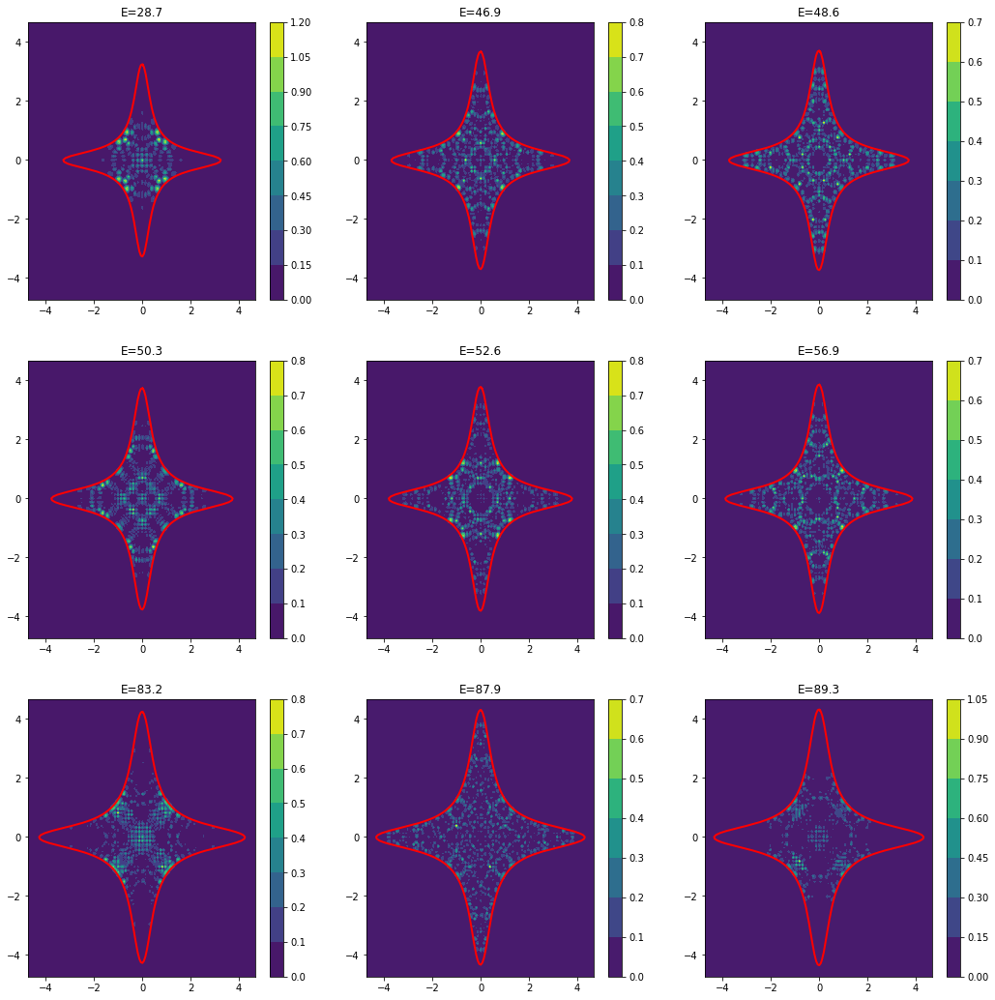

In [101]:
lst = []

row = 3
col = 3
fig, ax = plt.subplots(row,col, figsize=(15,15))

h1 = (x[-1] - x[0])/x.shape[0]
h2 = (y[-1] - y[0])/y.shape[0]
x = np.arange(xminp,xmaxp,dxp*2)
y = np.arange(yminp,ymaxp,dyp*2)
V_red = block_reduce(V, block_size=( 2, 2), func=np.mean)
for k in range(np.min([En_true.shape[0], row*col])):
    i = int(k/col)
    j = k%col
    if k not in lst:
        C = 1/np.sqrt(np.sum(np.real(phi_n[k])*np.real(phi_n[k])*h1*h2))
        phi = C*np.real(phi_n[k])
        
    else:
        C = 1/np.sqrt(np.sum(np.imag(phi_n[k])*np.imag(phi_n[k])*h1*h2))
        phi = C*np.imag(phi_n[k])
    
    C = 1/np.sqrt(np.sum(phi_n_true[k]*phi_n_true[k]*h1*h2))
    phi2 = np.real(np.conjugate(C*phi_n_true[k])*C*phi_n_true[k])
    cb = ax[i][j].contourf(x,y,phi2)# locator=ticker.LogLocator(base=10, numticks=200))#, cmap=cm.Blues)
    plt.colorbar(cb, ax = ax[i][j])
    ax[i][j].set_title("E={}".format(round(En_true[k],1)))
    
    # Contour plot
    contours = find_contours(V_red, En[k])
    for contour in contours:
        Nx = x.shape[0]
        contour = (xmaxp-xminp)/Nx*contour + xminp
        ax[i][j].plot(contour[:, 1], contour[:, 0], color='red', linewidth=2)

plt.tight_layout(pad=3)
plt.show()
hide_toggle(title = "True wavefunctions")

In [103]:
with open('waves_quarticE100_predicted.npy', 'wb') as f:
            waves= np.save(f,phi_n)
with open('waves_quarticE100_true.npy', 'wb') as f:
            waves= np.save(f,phi_n_true)

In [102]:
mse_scars = []  
for k in range(En.shape[0]):
    mse_scars.append(np.real(np.mean(np.conjugate(phi_n[k] - phi_n_true[k])*(phi_n[k] - phi_n_true[k]))))
mse_scars

[7.885627145117963e-07,
 2.6209355599056283e-06,
 7.747030488515269e-06,
 2.4850915217580316e-06,
 1.3358124617721312e-05,
 4.648353366363932e-06,
 1.4686637461282282e-05,
 2.2514235093316554e-05,
 1.2775001514712239e-05,
 2.4048273932482e-05]

## Calculated with diagonalization

In [135]:
with open('waves_quarticE100_exact.npy', 'rb') as f:
            true_waves= np.load(f)
true_waves = true_waves**2
phi2 = np.conjugate(phi_n)*phi_n
mse_scars = []  
for k in range(3):
    mse_scars.append(np.real(np.mean(np.conjugate(phi2[k] - true_waves[k])*(phi2[k] - true_waves[k]))))
mse_scars

[4.598432294686405e-06, 4.640074890173826e-06, 5.190239635564067e-06]

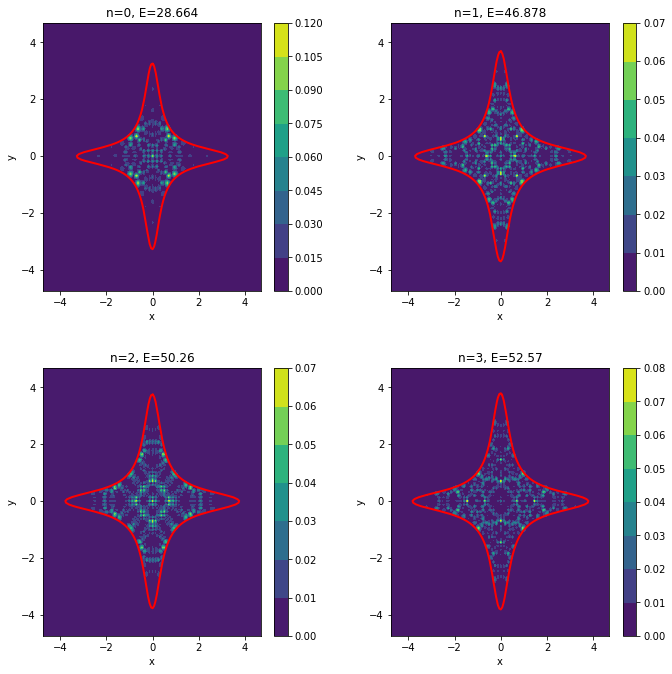

In [149]:
x = np.arange(xminp,xmaxp,dxp*2)
y = np.arange(yminp,ymaxp,dyp*2)

fig, ax = plt.subplots(2, 2,figsize=(10,10))
for k in range(true_waves.shape[0]):
    i = int(k/2)
    j = k%2
    
    cs = ax[i][j].contourf(x,y,true_waves[k,:,:])
    ax[i][j].set_title("n={}, E={}".format(k, round(En[k],3)))
    ax[i][j].set_xlabel("x")
    ax[i][j].set_ylabel("y")
    cbar = fig.colorbar(cs, ax=ax[i][j])

    contours = find_contours(V_red, En[k])
    for contour in contours:
        Nx = x.shape[0]
        contour = (xmaxp-xminp)/Nx*contour + xminp
        ax[i][j].plot(contour[:, 1], contour[:, 0], color='red', linewidth=2)

fig.tight_layout(pad=3.0)
plt.show()

hide_toggle(title = "Exact disgonalization")